In [60]:
import numpy as np
from osgeo import gdal
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn import preprocessing
import cv2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


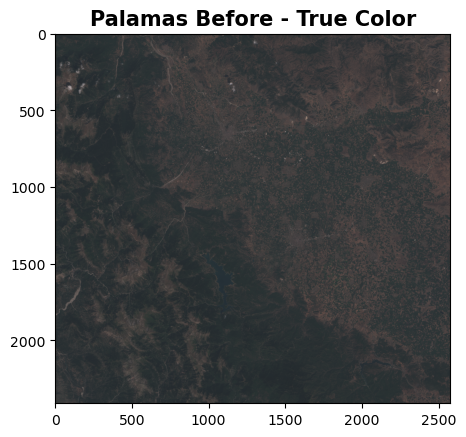

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


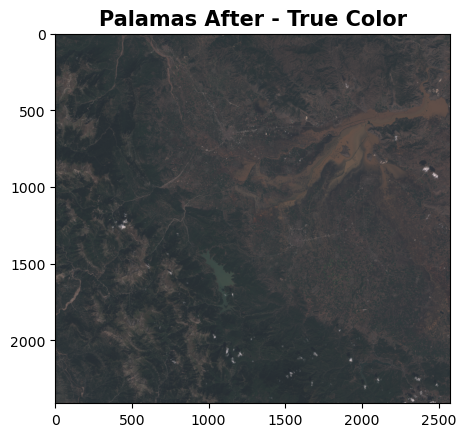

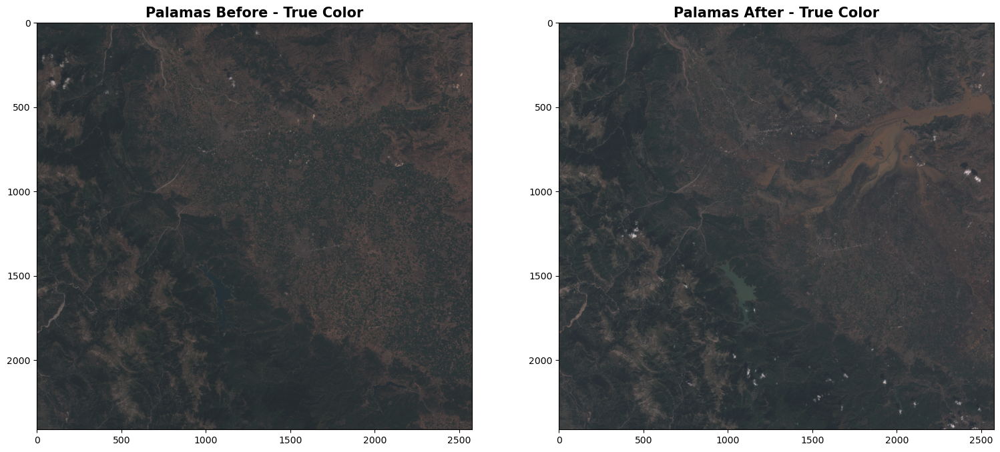

In [97]:
# access folder where image is located C:\Users\franc\Desktop\Corsi\Mapping\KN\Lec2
in_dir = 'C:\\Users\\franc\\Desktop\\Corsi\\Mapping\\KN\\'

dataset = gdal.Open(in_dir + 'palamas_before.tif')

bands = []

band1 = dataset.GetRasterBand(1) # Blue channel
band2 = dataset.GetRasterBand(2) # Red channel
band3 = dataset.GetRasterBand(3) # Green channel
band4 = dataset.GetRasterBand(4) # NIR channel
band5 = dataset.GetRasterBand(5) # SWIR1 channel

b1 = band1.ReadAsArray()
b2 = band2.ReadAsArray()
b3 = band3.ReadAsArray()
b4 = band4.ReadAsArray()
b5 = band5.ReadAsArray()


# Loop through each band and read it into a numpy array
for band_number in range(1, dataset.RasterCount + 1):
    band = dataset.GetRasterBand(band_number)
    band_array = band.ReadAsArray()
    bands.append(band_array)

# Stack the bands together into a 3D array
stacked_bands_bef = np.stack(bands, axis=2)

# true image
real_image_bef = np.stack((b3, b2, b1), axis=-1)
min_val = np.min(real_image_bef)*255
max_val = np.max(real_image_bef)*255
const = 255/(max_val - min_val)

real_img_bef = const * (real_image_bef)
plt.imshow(real_img_bef)
plt.title('Palamas Before - True Color', fontsize=15, fontweight='bold')
plt.show()



# Image after the flooding

dataset = gdal.Open(in_dir + 'palamas_after.tif')

bands = []

band1 = dataset.GetRasterBand(1) # Blue channel
band2 = dataset.GetRasterBand(2) # Green channel
band3 = dataset.GetRasterBand(3) # Red channel
band4 = dataset.GetRasterBand(4) # NIR channel
band5 = dataset.GetRasterBand(5) # SWIR1 channel

b1 = band1.ReadAsArray()
b2 = band2.ReadAsArray()
b3 = band3.ReadAsArray()
b4 = band4.ReadAsArray()
b5 = band5.ReadAsArray()


# Loop through each band and read it into a numpy array
for band_number in range(1, dataset.RasterCount + 1):
    band = dataset.GetRasterBand(band_number)
    band_array = band.ReadAsArray()
    bands.append(band_array)

# Stack the bands together into a 3D array
stacked_bands_aft = np.stack(bands, axis=2)

# true image
real_image_aft = np.stack((b3, b2, b1), axis=-1)
min_val = np.min(real_image_aft)*255
max_val = np.max(real_image_aft)*255
const = 255/(max_val - min_val)

real_img_aft = const * (real_image_aft)
plt.imshow(real_img_aft)
plt.title('Palamas After - True Color', fontsize=15, fontweight='bold')

# plot the two images next to each other

fig, (ax1, ax2) = plt.subplots(1, 2)
# change size
fig.set_size_inches(18.5, 10.5)
ax1.imshow(real_img_bef)
ax1.set_title('Palamas Before - True Color', fontsize=15, fontweight='bold')
ax2.imshow(real_img_aft)
ax2.set_title('Palamas After - True Color', fontsize=15, fontweight='bold')
plt.show()


In [98]:

from skimage import exposure

p2, p98 = np.percentile(real_image_bef, (2,98))
image_bef = exposure.rescale_intensity(real_image_bef, in_range=(p2, p98)) / 100000

p2, p98 = np.percentile(real_image_aft, (2,98))
image_aft = exposure.rescale_intensity(real_image_aft, in_range=(p2, p98)) / 100000


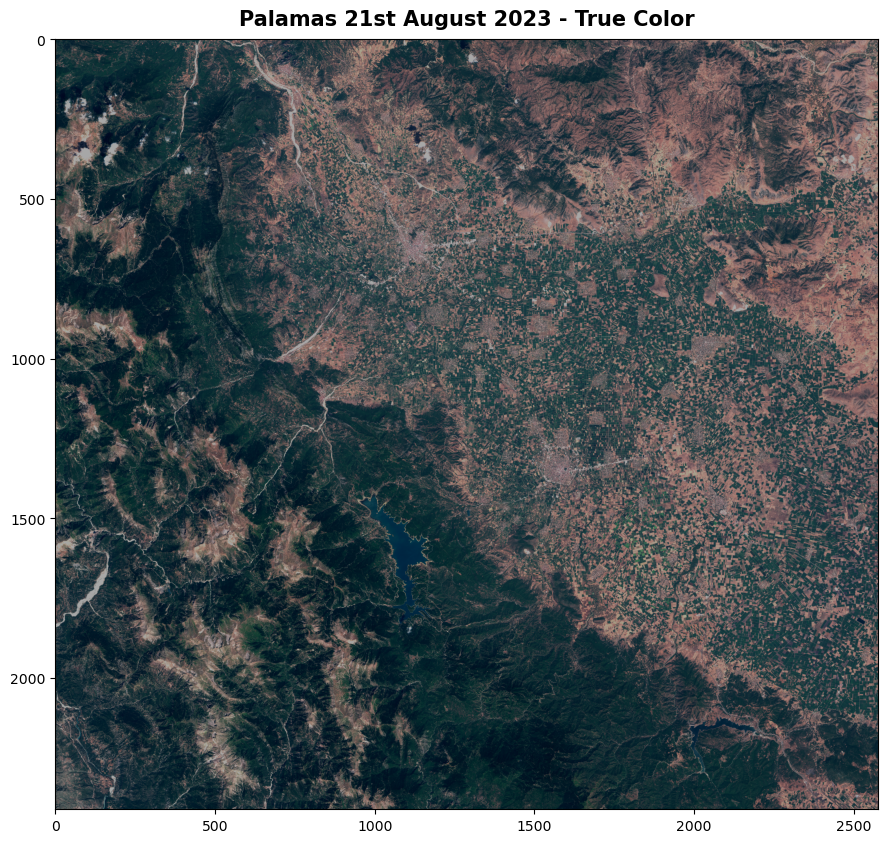

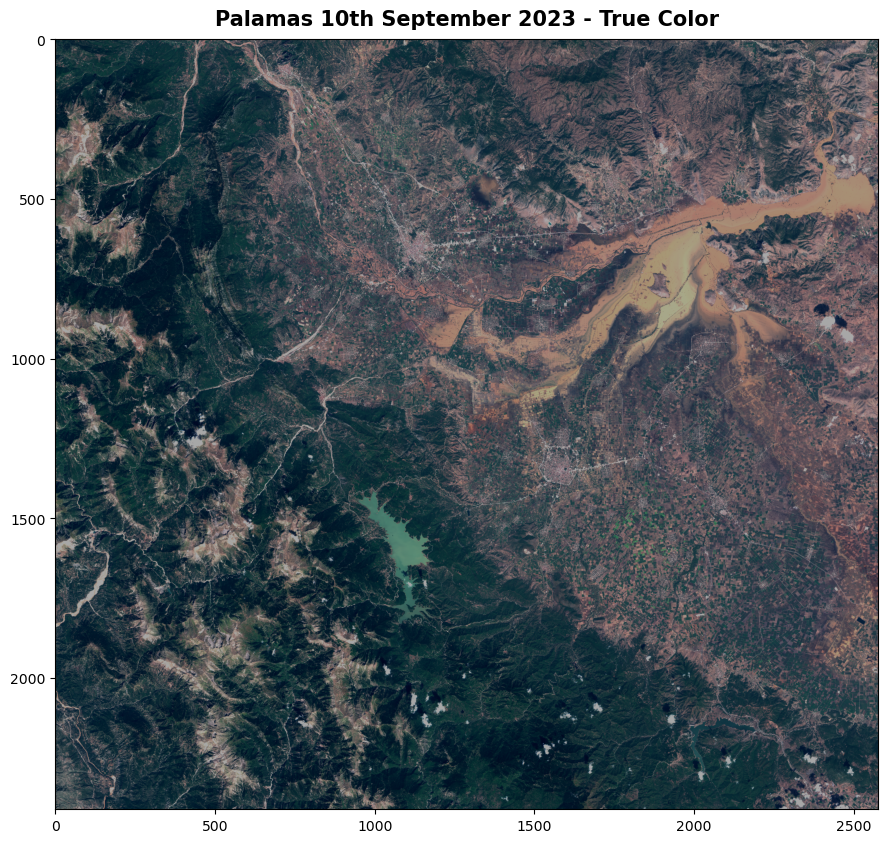

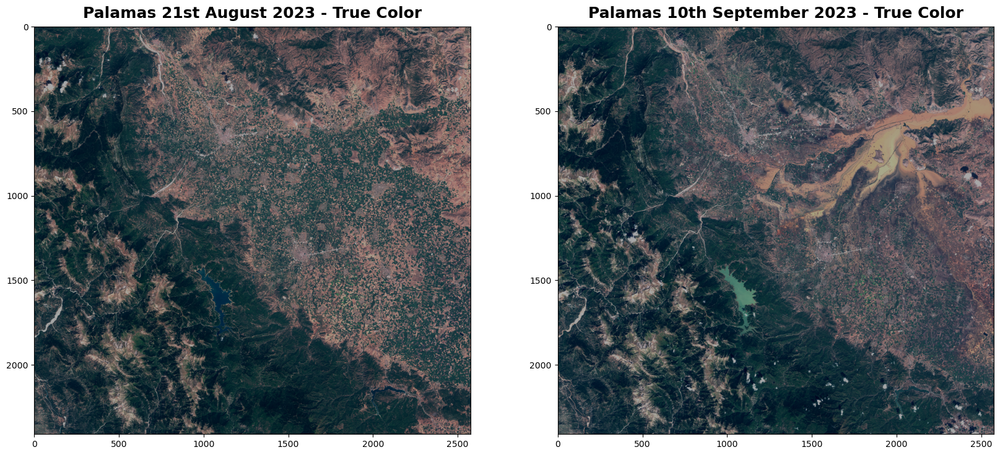

In [103]:
#figure size
plt.figure(figsize=(20,10))
plt.imshow(image_bef)
plt.title('Palamas 21st August 2023 - True Color', fontsize=15, fontweight='bold', pad=10)
plt.show()

#figure size
plt.figure(figsize=(20,10))
plt.imshow(image_aft)
plt.title('Palamas 10th September 2023 - True Color', fontsize=15, fontweight='bold', pad=10)
plt.show()

# plot them next to each other


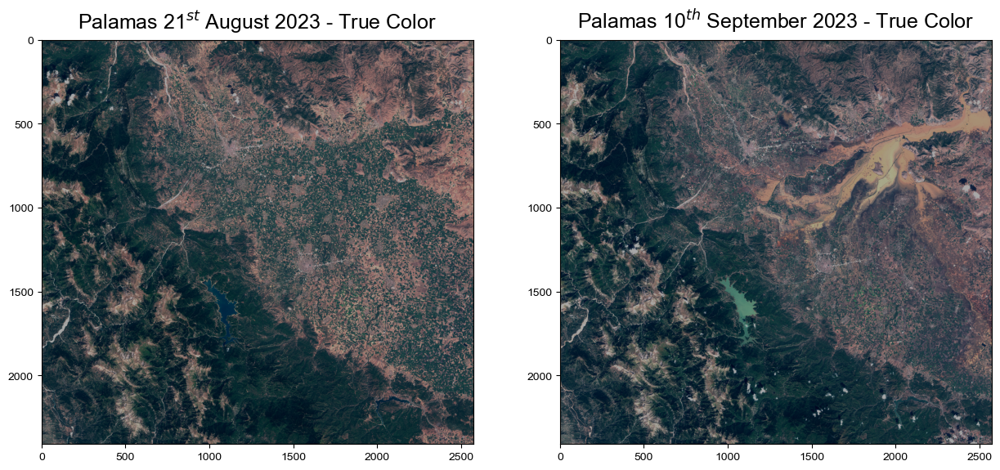

In [118]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
# put arial as a font
plt.rcParams['font.sans-serif'] = "Arial"
ax1.imshow(image_bef)
ax1.set_title('Palamas 21$^{st}$ August 2023 - True Color', fontsize=18, pad=10)
ax2.imshow(image_aft)
ax2.set_title('Palamas 10$^{th}$ September 2023 - True Color', fontsize=18, pad=10)
plt.show()



In [ ]:


# put them alongside each other
fig, ax = plt.subplots(1,2, figsize=(15,15))
ax[0].imshow(real_img_bef)
ax[0].set_title('Palamas Before - True Color', fontsize=15, fontweight='bold')
ax[1].imshow(image)
ax[1].set_title('Palamas Before - True Color', fontsize=15, fontweight='bold')
plt.show()



In [127]:
from sklearn.mixture import GaussianMixture 
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score as CHS
from matplotlib.colors import ListedColormap

# use KMeans to find the optimal number of clusters

# reshape the stacked image to be a list of pixels
X = stacked_bands_bef.reshape((-1, stacked_bands_bef.shape[2]))

# KMeans clustering with 2 clusters
k_means_2_bef = KMeans(n_clusters=2)
k_means_2_bef.fit(X)
cluster_assignments_2_bf = k_means_2_bef.predict(X)

# KMeans clustering with 3 clusters
k_means_3_bef = KMeans(n_clusters=3)
k_means_3_bef.fit(X)
cluster_assignments_3_bf = k_means_3_bef.predict(X)

# KMeans clustering with 4 clusters
k_means_4_bef = KMeans(n_clusters=4)
k_means_4_bef.fit(X)
cluster_assignments_4_bf = k_means_4_bef.predict(X)

# KMeans clustering with 5 clusters
k_means_5_bef = KMeans(n_clusters=5)
k_means_5_bef.fit(X)
cluster_assignments_5_bf = k_means_5_bef.predict(X)

# KMeans clustering with 6 clusters
k_means_6_bef = KMeans(n_clusters=6)
k_means_6_bef.fit(X)
cluster_assignments_6_bf = k_means_6_bef.predict(X)

k_means_7_bef = KMeans(n_clusters=7)
k_means_7_bef.fit(X)
cluster_assignment_7_bf = k_means_7_bef.predict(X)


c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 1

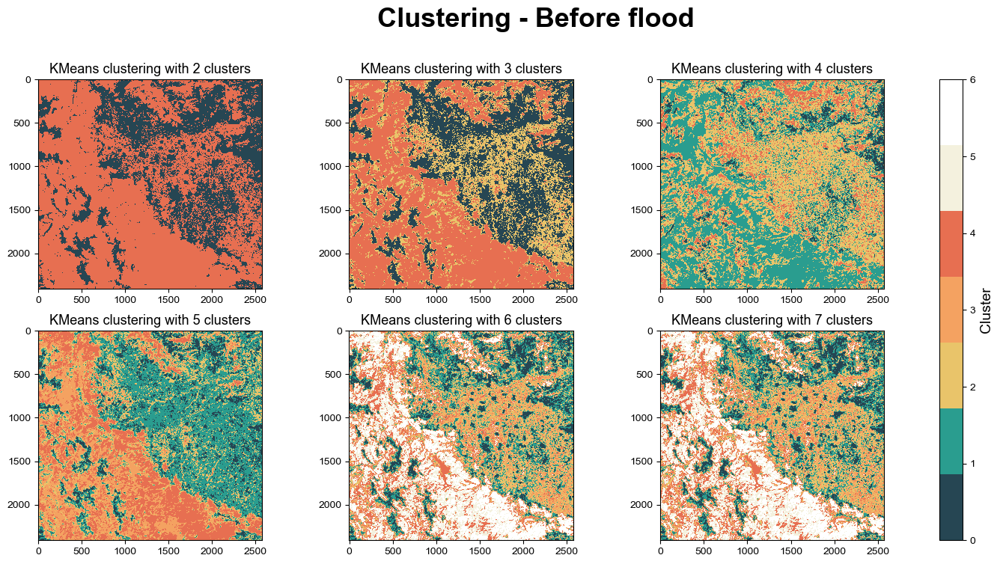

In [137]:

# Create a ListedColormap with distinct colors for each class
cmap_2_clusters_bf = ListedColormap(['#264653', '#e76f51'])
cmap_3_clusters_bf = ListedColormap(['#264653', '#e9c46a', '#e76f51'])
cmap_4_clusters_bf = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#e76f51'])
cmap_5_clusters_bf = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51'])
cmap_6_clusters_bf = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51', '#f4f1de'])
cmap_7_clusters_bf = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51', '#f4f1de', '#FFFFFF'])

# Plot the clusters with distinct colors
fig, axs = plt.subplots(2, 3, figsize=(19, 8))

# big title
# center the title
fig.suptitle('Clustering - Before flood', fontsize=26, fontweight='bold', va='center', ha='center')
plt.rcParams['font.sans-serif'] = "Arial"
axs[0, 0].imshow(cluster_assignments_2_bf.reshape(b1.shape), cmap=cmap_2_clusters_bf)
axs[0, 0].set_title('KMeans clustering with 2 clusters', fontsize=13)

axs[0, 1].imshow(cluster_assignments_3_bf.reshape(b1.shape), cmap=cmap_3_clusters_bf)
axs[0, 1].set_title('KMeans clustering with 3 clusters', fontsize=13)

axs[0, 2].imshow(cluster_assignments_4_bf.reshape(b1.shape), cmap=cmap_4_clusters_bf)
axs[0, 2].set_title('KMeans clustering with 4 clusters', fontsize=13)

axs[1, 0].imshow(cluster_assignments_5_bf.reshape(b1.shape), cmap=cmap_5_clusters_bf)
axs[1, 0].set_title('KMeans clustering with 5 clusters', fontsize=13)

axs[1, 1].imshow(cluster_assignments_6_bf.reshape(b1.shape), cmap=cmap_6_clusters_bf)
axs[1, 1].set_title('KMeans clustering with 6 clusters', fontsize=13)

axs[1, 2].imshow(cluster_assignment_7_bf.reshape(b1.shape), cmap=cmap_7_clusters_bf)
axs[1, 2].set_title('KMeans clustering with 7 clusters', fontsize=13)

# Add a colorbar
cbar = plt.colorbar(axs[1, 1].imshow(cluster_assignment_7_bf.reshape(b1.shape), cmap=cmap_7_clusters_bf), ax=axs, orientation='vertical', ticks=[0, 1, 2, 3, 4, 5,6])
cbar.set_label('Cluster', fontsize=14)

plt.show()


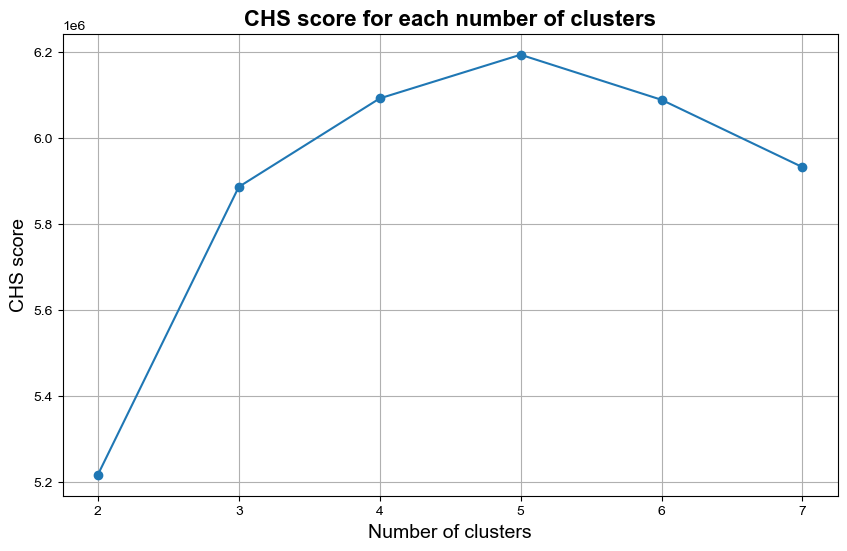

In [129]:
 # Visualize the chs score for each number of clusters in a plot

chs_scores_2 = CHS(X, cluster_assignments_2_bf)
chs_scores_3 = CHS(X, cluster_assignments_3_bf)
chs_scores_4 = CHS(X, cluster_assignments_4_bf)
chs_scores_5 = CHS(X, cluster_assignments_5_bf)
chs_scores_6 = CHS(X, cluster_assignments_6_bf)
chs_scores_7 = CHS(X, cluster_assignment_7_bf)

# append in a list
chs_scores = [chs_scores_2, chs_scores_3, chs_scores_4, chs_scores_5, chs_scores_6, chs_scores_7]


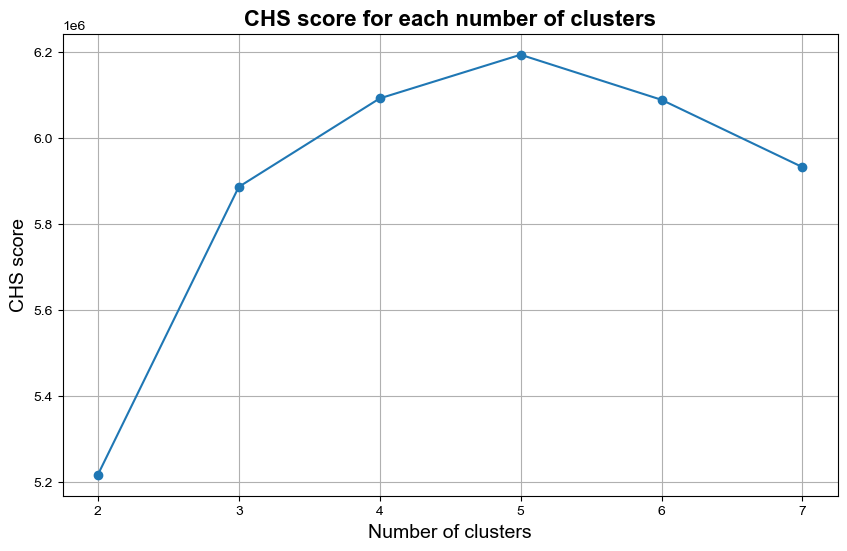

In [130]:

# plot the chs scores
plt.figure(figsize=(10, 6))
plt.rcParams['font.sans-serif'] = "Arial"
plt.plot([2, 3, 4, 5, 6, 7], chs_scores, marker='o')
plt.xlabel('Number of clusters', fontsize=14)
plt.ylabel('CHS score', fontsize=14)
plt.title('CHS score for each number of clusters', fontsize=16, fontweight='bold')
plt.grid()
plt.show()


In [73]:
# Do the same with 2 3 4 5 6 clusters

X = stacked_bands_aft.reshape((-1, stacked_bands_aft.shape[2]))

# KMeans clustering with 2 clusters
k_means_2_aft = KMeans(n_clusters=2)
k_means_2_aft.fit(X)
cluster_assignments_2_aft = k_means_2_aft.predict(X)

# KMeans clustering with 3 clusters
k_means_3_aft = KMeans(n_clusters=3)
k_means_3_aft.fit(X)
cluster_assignments_3_aft = k_means_3_aft.predict(X)

# KMeans clustering with 4 clusters
k_means_4_aft = KMeans(n_clusters=4)
k_means_4_aft.fit(X)
cluster_assignments_4_aft = k_means_4_aft.predict(X)

# KMeans clustering with 5 clusters
k_means_5_aft = KMeans(n_clusters=5)
k_means_5_aft.fit(X)
cluster_assignments_5_aft = k_means_5_aft.predict(X)

# KMeans clustering with 6 clusters
k_means_6_aft = KMeans(n_clusters=6)
k_means_6_aft.fit(X)
cluster_assignments_6_aft = k_means_6_aft.predict(X)

k_means_7_aft = KMeans(n_clusters=7)
k_means_7_aft.fit(X)
cluster_assignment_7_aft = k_means_7_aft.predict(X)


c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 1

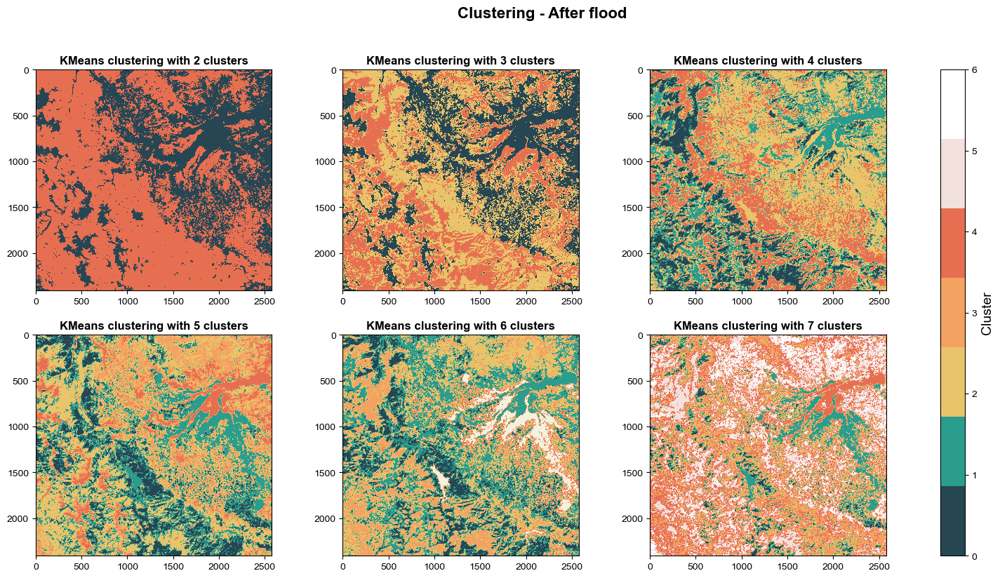

In [136]:

# Create a ListedColormap with distinct colors for each class
cmap_2_clusters_aft = ListedColormap(['#264653', '#e76f51'])
cmap_3_clusters_aft = ListedColormap(['#264653', '#e9c46a', '#e76f51'])
cmap_4_clusters_aft = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#e76f51'])
cmap_5_clusters_aft = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51'])
cmap_6_clusters_aft = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51', '#f4f1de'])
cmap_7_clusters_aft = ListedColormap(['#264653', '#2a9d8f', '#e9c46a', '#f4a261', '#e76f51', '#f3e1de', '#FFFFFF'])

# Plot the clusters with distinct colors
fig, axs = plt.subplots(2, 3, figsize=(20, 9))

# big title
fig.suptitle('Clustering - After flood', fontsize=16, fontweight='bold')

axs[0, 0].imshow(cluster_assignments_2_aft.reshape(b1.shape), cmap=cmap_2_clusters_aft)
axs[0, 0].set_title('KMeans clustering with 2 clusters', fontsize=12, fontweight='bold')

axs[0, 1].imshow(cluster_assignments_3_aft.reshape(b1.shape), cmap=cmap_3_clusters_aft)
axs[0, 1].set_title('KMeans clustering with 3 clusters', fontsize=12, fontweight='bold')

axs[0, 2].imshow(cluster_assignments_4_aft.reshape(b1.shape), cmap=cmap_4_clusters_aft)
axs[0, 2].set_title('KMeans clustering with 4 clusters', fontsize=12, fontweight='bold')

axs[1, 0].imshow(cluster_assignments_5_aft.reshape(b1.shape), cmap=cmap_5_clusters_aft)
axs[1, 0].set_title('KMeans clustering with 5 clusters', fontsize=12, fontweight='bold')

axs[1, 1].imshow(cluster_assignments_6_aft.reshape(b1.shape), cmap=cmap_6_clusters_aft)
axs[1, 1].set_title('KMeans clustering with 6 clusters', fontsize=12, fontweight='bold')

axs[1, 2].imshow(cluster_assignment_7_aft.reshape(b1.shape), cmap=cmap_7_clusters_aft)
axs[1, 2].set_title('KMeans clustering with 7 clusters', fontsize=12, fontweight='bold')

# Add a colorbar
cbar = plt.colorbar(axs[1, 2].imshow(cluster_assignment_7_aft.reshape(b1.shape), cmap=cmap_7_clusters_aft), ax=axs, orientation='vertical', ticks=[0, 1, 2, 3, 4, 5,6])
cbar.set_label('Cluster', fontsize=14)

plt.show()

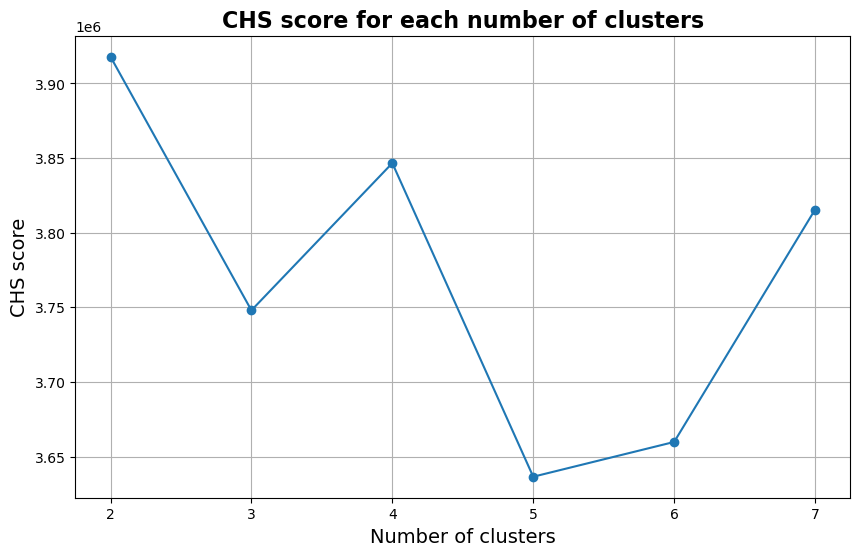

In [67]:
 # Visualize the chs score for each number of clusters in a plot

chs_scores_2_af = CHS(X, cluster_assignments_2_aft)
chs_scores_3_af = CHS(X, cluster_assignments_3_aft)
chs_scores_4_af = CHS(X, cluster_assignments_4_aft)
chs_scores_5_af = CHS(X, cluster_assignments_5_aft)
chs_scores_6_af = CHS(X, cluster_assignments_6_aft)
chs_scores_7_af = CHS(X, cluster_assignment_7_aft)

# append in a list
chs_scores_af = [chs_scores_2_af, chs_scores_3_af, chs_scores_4_af, chs_scores_5_af, chs_scores_6_af, chs_scores_7_af]



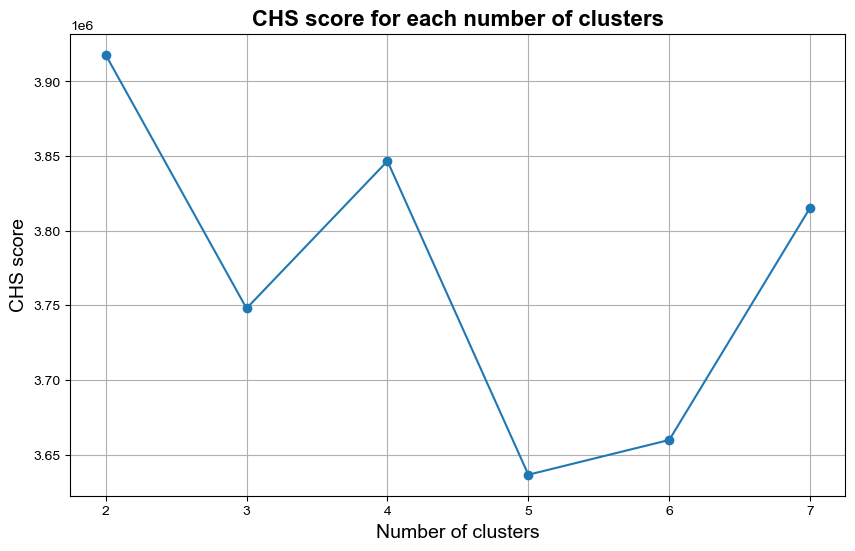

In [132]:

# plot the chs scores
plt.figure(figsize=(10, 6))
plt.rcParams['font.sans-serif'] = "Arial"
plt.plot([2, 3, 4, 5, 6, 7], chs_scores_af, marker='o')
plt.xlabel('Number of clusters', fontsize=14)
plt.ylabel('CHS score', fontsize=14)
plt.title('CHS score for each number of clusters - After the flood', fontsize=16, fontweight='bold')
plt.grid()
plt.show()


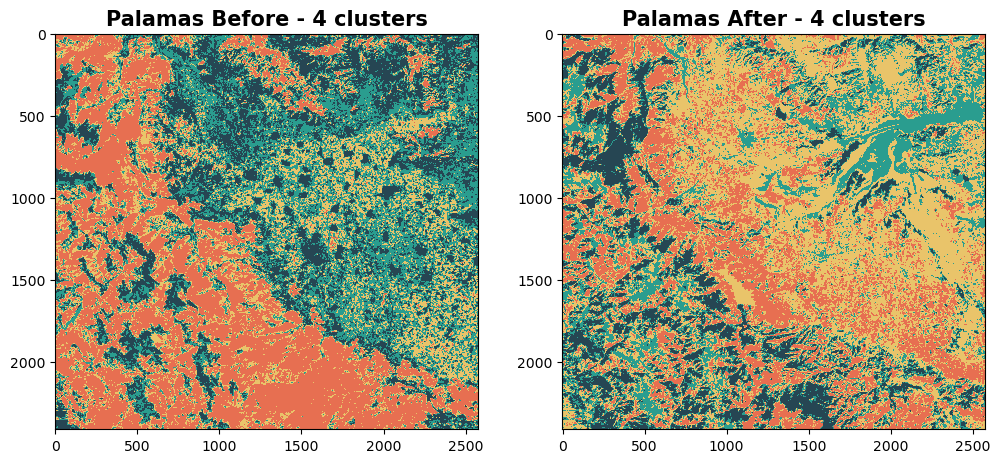

[[2132.18949141 2117.3143302  2167.46145329 2443.34087329 3203.51266985]
 [2420.39253714 2482.78679965 2796.54973089 3004.68632277 3543.22388682]
 [1958.45538709 1938.26904776 1656.65217256 2114.230688   4166.11481692]
 [1843.89687007 1759.7144911  1538.10335871 1853.14896224 2951.34843907]]
[[1792.31251097 1666.6639057  1463.82156429 1698.92218184 2494.88829605]
 [2386.83315009 2436.71572118 2657.36575138 2829.93166377 3134.8573056 ]
 [2100.93002654 2050.14328051 2093.51119094 2265.19804944 2641.86922216]
 [1887.55118969 1840.3587751  1615.18951291 2036.47426716 3349.57260818]]


In [74]:
# plot the two images next to each other

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(cluster_assignments_4_bf.reshape(b1.shape), cmap=cmap_4_clusters_bf)
ax1.set_title('Palamas Before - 4 clusters', fontsize=15, fontweight='bold')
ax2.imshow(cluster_assignments_4_aft.reshape(b1.shape), cmap=cmap_4_clusters_aft)
ax2.set_title('Palamas After - 4 clusters', fontsize=15, fontweight='bold')
plt.show()


# print the centers of the clusters for the first image

print(k_means_4_bef.cluster_centers_)
print(k_means_4_aft.cluster_centers_)


In [75]:

centers = k_means_4_bef.cluster_centers_
# get the centers from the second clustering
centers_random = k_means_4_aft.cluster_centers_
# create a list to store the reordered centers
centers_random_reordered = []
# loop through each center from the first clustering
for center in centers:
    # find the index of the center from the second clustering that is closest to the center from the first clustering
    index = np.argmin(np.linalg.norm(centers_random - center, axis=1))
    # append the center from the second clustering to the list
    centers_random_reordered.append(centers_random[index])
# convert the list to an array
centers_random_reordered = np.array(centers_random_reordered)
# set the centers of the second clustering to the reordered centers
k_means_4_aft.cluster_centers_ = centers_random_reordered




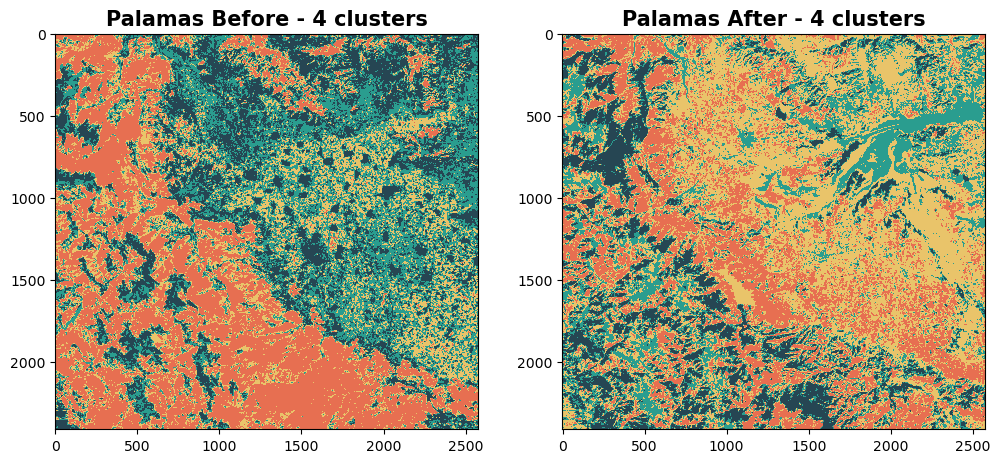

In [76]:

# plot the two images next to each other

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(cluster_assignments_4_bf.reshape(b1.shape), cmap=cmap_4_clusters_bf)
ax1.set_title('Palamas Before - 4 clusters', fontsize=15, fontweight='bold')
ax2.imshow(cluster_assignments_4_aft.reshape(b1.shape), cmap=cmap_4_clusters_aft)
ax2.set_title('Palamas After - 4 clusters', fontsize=15, fontweight='bold')
plt.show()


In [ ]:
# # Create a ListedColormap with distinct colors for each class
# # Create a ListedColormap with distinct colors for each class
# cmap_3_clusters = ListedColormap(['#264653', '#e9c46a', '#e76f51'])
# cmap_4_clusters = ListedColormap(['#2a9d8f', '#264653', '#e9c46a', '#e76f51'])
# #cmap_5_clusters = ListedColormap(['#f4a261', '#87bfff', '#264653', '#e9c46a', '#2a9d8f'])
# cmap_5_clusters = ListedColormap(['#e9c46a', '#2a9d8f', '#264653', '#f4a261', '#e76f51'])

# # Plot the clusters with distinct colors
# fig, axs = plt.subplots(1, 3, figsize=(18, 6))



# axs[0].imshow(cluster_assignments_3.reshape(b1.shape), cmap=cmap_3_clusters)
# axs[0].set_title('KMeans clustering with 3 clusters', fontsize=12, fontweight='bold')

# axs[1].imshow(cluster_assignments_4.reshape(b1.shape), cmap=cmap_4_clusters)
# axs[1].set_title('KMeans clustering with 4 clusters', fontsize=12, fontweight='bold')

# axs[2].imshow(cluster_assignments_5.reshape(b1.shape), cmap=cmap_5_clusters)
# axs[2].set_title('KMeans clustering with 5 clusters', fontsize=12, fontweight='bold')

# # Add a colorbar
# cbar = plt.colorbar(axs[2].imshow(cluster_assignments_5.reshape(b1.shape), cmap=cmap_5_clusters), ax=axs, orientation='vertical', ticks=[0, 1, 2, 3, 4])
# cbar.set_label('Cluster', fontsize=14)


c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


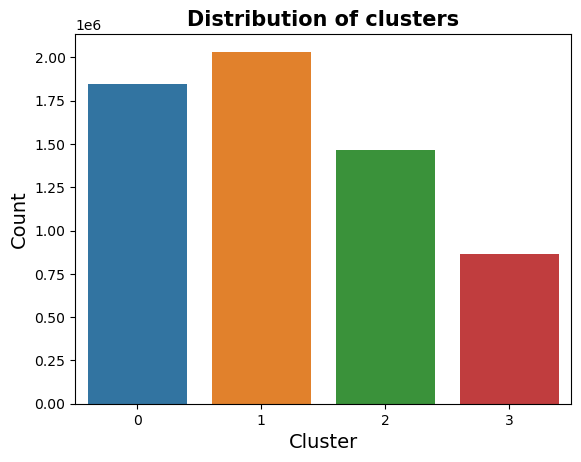

In [ ]:
# Plot the distribution of the k-means clusters for the image with the heighest CHS

# Create a dataframe with the cluster assignments
df = pd.DataFrame({'Cluster': cluster_assignments_4})

# Plot the distribution of the clusters
sns.countplot(x='Cluster', data=df)
plt.title('Distribution of clusters', fontsize=15, fontweight='bold')
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()


In [ ]:
# try another initialization method
# KMeans clustering with 4 clusters
k_means_4_r = KMeans(n_clusters=4, init='random', n_init=1)
k_means_4_r.fit(X)
cluster_assignments_4_r = k_means_4.predict(X)


# # reorder order of centers so that the they are in the same order as the first clustering
# # get the centers from the first clustering
# centers = k_means_4.cluster_centers_
# # get the centers from the second clustering
# centers_random = k_means_4_random.cluster_centers_
# # create a list to store the reordered centers
# centers_random_reordered = []
# # loop through each center from the first clustering
# for center in centers:
#     # find the index of the center from the second clustering that is closest to the center from the first clustering
#     index = np.argmin(np.linalg.norm(centers_random - center, axis=1))
#     # append the center from the second clustering to the list
#     centers_random_reordered.append(centers_random[index])
# # convert the list to an array
# centers_random_reordered = np.array(centers_random_reordered)
# # set the centers of the second clustering to the reordered centers
# k_means_4_random.cluster_centers_ = centers_random_reordered

Centers of the 4 clusters:
Cluster 0: [1791.4084513  1665.65781139 1462.15192629 1697.73618533 2496.0549278 ]
Cluster 1: [2100.19551585 2049.0178023  2091.96348786 2262.99380503 2638.01465562]
Cluster 2: [1887.94442963 1840.77456754 1615.9939941  2037.05245858 3348.93461154]
Cluster 3: [2384.9126898  2434.174833   2653.67937692 2826.70133331 3133.41574777]

Centers of the 4 clusters (random initialization):
Cluster 0: [1790.81234753 1664.84862186 1461.10237351 1696.37437051 2494.3874421 ]
Cluster 1: [2099.56812317 2048.1317914  2090.57733504 2261.5661467  2636.63666804]
Cluster 2: [1887.72940088 1840.41137218 1615.62016472 2036.39193882 3347.51046095]
Cluster 3: [2383.56503084 2432.44599812 2651.20392278 2824.46621271 3132.12040489]



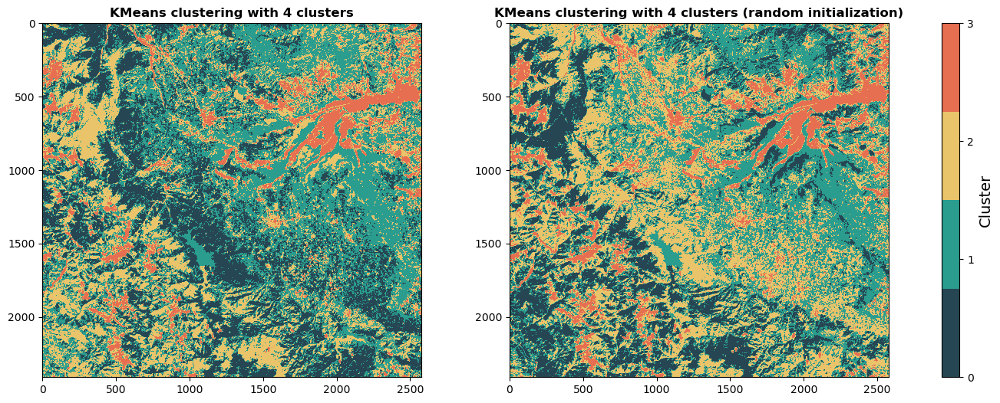

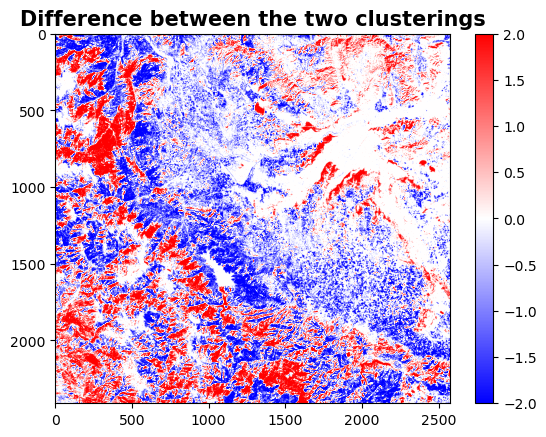

In [ ]:
# put them in ascending order based on the first cluster
# reorder order of centers so that the they are in the same order as the first clustering
# get the centers from the first clustering
centers = k_means_4_bef.cluster_centers_
# get the centers from the second clustering
centers_random = k_means_4_r.cluster_centers_
# create a list to store the reordered centers
centers_random_reordered = []
# loop through each center from the first clustering
for center in centers:
    # find the index of the center from the second clustering that is closest to the center from the first clustering
    index = np.argmin(np.linalg.norm(centers_random - center, axis=1))
    # append the center from the second clustering to the list
    centers_random_reordered.append(centers_random[index])
# convert the list to an array
centers_random_reordered = np.array(centers_random_reordered)
# set the centers of the second clustering to the reordered centers
k_means_4_r.cluster_centers_ = centers_random_reordered


# print the centers in a more readable format

print('Centers of the 4 clusters:')
for i in range(4):
    print('Cluster {}: {}'.format(i, k_means_4.cluster_centers_[i]))
print('')
# print the centers for the second clustering
print('Centers of the 4 clusters (random initialization):')
for i in range(4):
    print('Cluster {}: {}'.format(i, k_means_4_r.cluster_centers_[i]))
print('')

# Plot the clusters with distinct colors
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

axs[0].imshow(cluster_assignments_4.reshape(b1.shape), cmap=cmap_4_clusters)
axs[0].set_title('KMeans clustering with 4 clusters', fontsize=12, fontweight='bold')

axs[1].imshow(cluster_assignments_4_r.reshape(b1.shape), cmap=cmap_4_clusters)
axs[1].set_title('KMeans clustering with 4 clusters (random initialization)', fontsize=12, fontweight='bold')

# Add a colorbar
cbar = plt.colorbar(axs[1].imshow(cluster_assignments_4_r.reshape(b1.shape), cmap=cmap_4_clusters), ax=axs, orientation='vertical', ticks=[0, 1, 2, 3])
cbar.set_label('Cluster', fontsize=14)

plt.show()

# reshape the clusters to the shape of the image
cluster_assignments_4_img = cluster_assignments_4.reshape(b1.shape)
cluster_assignments_4_r_img = cluster_assignments_4_r.reshape(b1.shape)

# take the difference between the two clusterings
cluster_diff = cluster_assignments_4_img - cluster_assignments_4_r_img



# Plot the difference between the two clusterings
plt.imshow(cluster_diff.reshape(b1.shape), cmap='bwr')
plt.title('Difference between the two clusterings', fontsize=15, fontweight='bold')
plt.colorbar()
plt.show()




# TESTTESTTEST Same exact thing but for 6 clustering

In [ ]:
# same exact thing but with 6 clusters
# KMeans clustering with 6 clusters
k_means_6 = KMeans(n_clusters=6)
k_means_6.fit(X)
cluster_assignments_6 = k_means_6.predict(X)

# KMeans clustering with 6 clusters
k_means_6_r = KMeans(n_clusters=6, init='random', n_init=1)
k_means_6_r.fit(X)
cluster_assignments_6_r = k_means_6_r.predict(X)

# put them in ascending order based on the first cluster
# reorder order of centers so that the they are in the same order as the first clustering
# get the centers from the first clustering
centers = k_means_6.cluster_centers_
# get the centers from the second clustering
centers_random = k_means_6_r.cluster_centers_
# create a list to store the reordered centers
centers_random_reordered = []
# loop through each center from the first clustering
for center in centers:
    # find the index of the center from the second clustering that is closest to the center from the first clustering
    index = np.argmin(np.linalg.norm(centers_random - center, axis=1))
    # append the center from the second clustering to the list
    centers_random_reordered.append(centers_random[index])
# convert the list to an array
centers_random_reordered = np.array(centers_random_reordered)
# set the centers of the second clustering to the reordered centers
k_means_6_r.cluster_centers_ = centers_random_reordered



c:\Users\franc\anaconda3\envs\ESA\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Centers of the 6 clusters:
Cluster 0: [2089.57688721 2042.58453316 2057.73367289 2298.91557441 2868.89895994]
Cluster 1: [1873.39656674 1827.69225726 1583.44605091 2021.54826056 3414.24441741]
Cluster 2: [1779.31160678 1657.61117746 1440.75425441 1702.85887809 2591.63990365]
Cluster 3: [2356.65872115 2408.42329821 2639.94113842 2798.23670914 3058.79836999]
Cluster 4: [3719.59143686 3762.99398105 4060.61726287 4203.43998122 4614.42790062]
Cluster 5: [2072.77776292 2001.6901151  2037.1611114  2077.98748127 2106.59598756]

Centers of the 6 clusters (random initialization):
Cluster 0: [2146.69905265 2117.16700565 2177.10068435 2408.64000361 2938.95699752]
Cluster 1: [1892.35591262 1864.86835734 1607.80934942 2090.40583763 3643.70928391]
Cluster 2: [1739.23586687 1593.48635192 1376.52290892 1583.45801362 2349.93051932]
Cluster 3: [2475.82993597 2552.96349394 2832.21973716 2969.74628536 3159.88901497]
Cluster 4: [2475.82993597 2552.96349394 2832.21973716 2969.74628536 3159.88901497]
Cluster 

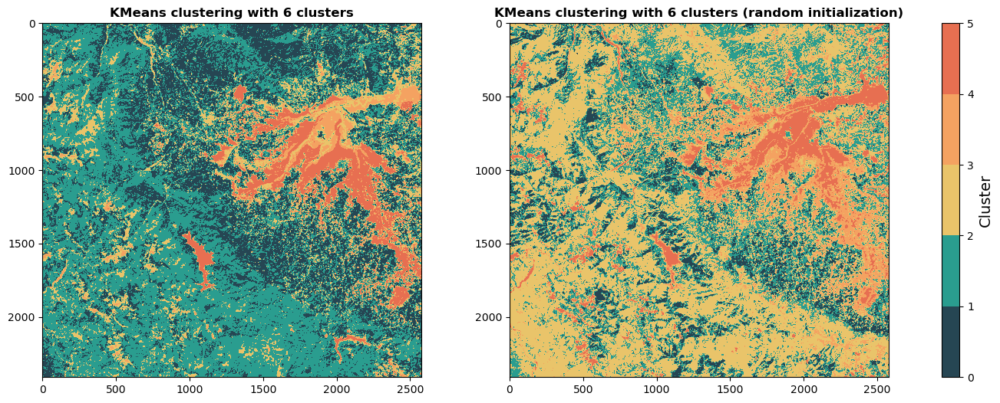

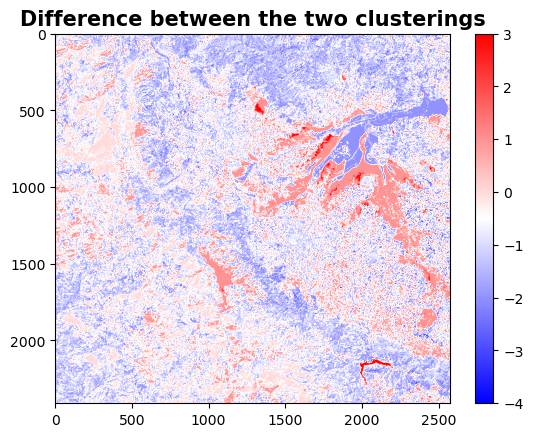

In [ ]:

# print the centers in a more readable format

print('Centers of the 6 clusters:')
for i in range(6):
    print('Cluster {}: {}'.format(i, k_means_6.cluster_centers_[i]))
print('')
# print the centers for the second clustering
print('Centers of the 6 clusters (random initialization):')
for i in range(6):
    print('Cluster {}: {}'.format(i, k_means_6_r.cluster_centers_[i]))
print('')
# Plot the clusters with distinct colors
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

axs[0].imshow(cluster_assignments_6.reshape(b1.shape), cmap=cmap_5_clusters)
axs[0].set_title('KMeans clustering with 6 clusters', fontsize=12, fontweight='bold')

axs[1].imshow(cluster_assignments_6_r.reshape(b1.shape), cmap=cmap_5_clusters)
axs[1].set_title('KMeans clustering with 6 clusters (random initialization)', fontsize=12, fontweight='bold')

# Add a colorbar
cbar = plt.colorbar(axs[1].imshow(cluster_assignments_6_r.reshape(b1.shape), cmap=cmap_5_clusters), ax=axs, orientation='vertical', ticks=[0, 1, 2, 3, 4, 5])
cbar.set_label('Cluster', fontsize=14)

plt.show()

# reshape the clusters to the shape of the image
cluster_assignments_6_img = cluster_assignments_6.reshape(b1.shape)
cluster_assignments_6_r_img = cluster_assignments_6_r.reshape(b1.shape)

# take the difference between the two clusterings
cluster_diff = cluster_assignments_6_img - cluster_assignments_6_r_img

# Plot the difference between the two clusterings
plt.imshow(cluster_diff.reshape(b1.shape), cmap='bwr')
plt.title('Difference between the two clusterings', fontsize=15, fontweight='bold')
plt.colorbar()
plt.show()
